In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd 
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from hyperparameter_tuning import *

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)  

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from sklearn.preprocessing import StandardScaler

In [3]:
import os
# os.environ['DYLD_LIBRARY_PATH'] = '/usr/local/opt/homebrew/opt/libomp/lib'
import lightgbm as lgb

In [4]:
X_data_player_away=pd.read_csv('Train_Data/train_away_player_statistics_df.csv',index_col='ID')
X_data_player_home=pd.read_csv('Train_Data/train_home_player_statistics_df.csv',index_col='ID')

In [5]:
X_data_team_away=pd.read_csv('Train_Data/train_away_team_statistics_df.csv',index_col='ID')
X_data_team_home=pd.read_csv('Train_Data/train_home_team_statistics_df.csv',index_col='ID')

In [98]:
X_data_team_home

,LEAGUE,TEAM_NAME,TEAM_SHOTS_TOTAL_season_sum,TEAM_SHOTS_INSIDEBOX_season_sum,TEAM_SHOTS_OFF_TARGET_season_sum,TEAM_SHOTS_ON_TARGET_season_sum,TEAM_SHOTS_OUTSIDEBOX_season_sum,TEAM_PASSES_season_sum,TEAM_SUCCESSFUL_PASSES_season_sum,TEAM_SAVES_season_sum,TEAM_CORNERS_season_sum,TEAM_FOULS_season_sum,TEAM_YELLOWCARDS_season_sum,TEAM_REDCARDS_season_sum,TEAM_OFFSIDES_season_sum,TEAM_ATTACKS_season_sum,TEAM_PENALTIES_season_sum,TEAM_SUBSTITUTIONS_season_sum,TEAM_BALL_SAFE_season_sum,TEAM_DANGEROUS_ATTACKS_season_sum,TEAM_INJURIES_season_sum,TEAM_GOALS_season_sum,TEAM_GAME_WON_season_sum,TEAM_GAME_DRAW_season_sum,TEAM_GAME_LOST_season_sum,TEAM_SHOTS_TOTAL_season_average,TEAM_SHOTS_INSIDEBOX_season_average,TEAM_SHOTS_OFF_TARGET_season_average,TEAM_SHOTS_ON_TARGET_season_average,TEAM_SHOTS_OUTSIDEBOX_season_average,TEAM_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,TEAM_SAVES_season_average,TEAM_CORNERS_season_average,TEAM_BALL_POSSESSION_season_average,TEAM_FOULS_season_average,TEAM_YELLOWCARDS_season_average,TEAM_REDCARDS_season_average,TEAM_OFFSIDES_season_average,TEAM_ATTACKS_season_average,TEAM_PENALTIES_season_average,TEAM_SUBSTITUTIONS_season_average,TEAM_BALL_SAFE_season_average,TEAM_DANGEROUS_ATTACKS_season_average,TEAM_INJURIES_season_average,TEAM_GOALS_season_average,TEAM_GAME_WON_season_average,TEAM_GAME_DRAW_season_average,TEAM_GAME_LOST_season_average,TEAM_SHOTS_TOTAL_season_std,TEAM_SHOTS_INSIDEBOX_season_std,TEAM_SHOTS_OFF_TARGET_season_std,TEAM_SHOTS_ON_TARGET_season_std,TEAM_SHOTS_OUTSIDEBOX_season_std,TEAM_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_std,TEAM_SAVES_season_std,TEAM_CORNERS_season_std,TEAM_BALL_POSSESSION_season_std,TEAM_FOULS_season_std,TEAM_YELLOWCARDS_season_std,TEAM_REDCARDS_season_std,TEAM_OFFSIDES_season_std,TEAM_ATTACKS_season_std,TEAM_PENALTIES_season_std,TEAM_SUBSTITUTIONS_season_std,TEAM_BALL_SAFE_season_std,TEAM_DANGEROUS_ATTACKS_season_std,TEAM_INJURIES_season_std,TEAM_GOALS_season_std,TEAM_SHOTS_TOTAL_5_last_match_sum,TEAM_SHOTS_INSIDEBOX_5_last_match_sum,TEAM_SHOTS_OFF_TARGET_5_last_match_sum,TEAM_SHOTS_ON_TARGET_5_last_match_sum,TEAM_SHOTS_OUTSIDEBOX_5_last_match_sum,TEAM_PASSES_5_last_match_sum,TEAM_SUCCESSFUL_PASSES_5_last_match_sum,TEAM_SAVES_5_last_match_sum,TEAM_CORNERS_5_last_match_sum,TEAM_FOULS_5_last_match_sum,TEAM_YELLOWCARDS_5_last_match_sum,TEAM_REDCARDS_5_last_match_sum,TEAM_OFFSIDES_5_last_match_sum,TEAM_ATTACKS_5_last_match_sum,TEAM_PENALTIES_5_last_match_sum,TEAM_SUBSTITUTIONS_5_last_match_sum,TEAM_BALL_SAFE_5_last_match_sum,TEAM_DANGEROUS_ATTACKS_5_last_match_sum,TEAM_INJURIES_5_last_match_sum,TEAM_GOALS_5_last_match_sum,TEAM_GAME_WON_5_last_match_sum,TEAM_GAME_DRAW_5_last_match_sum,TEAM_GAME_LOST_5_last_match_sum,TEAM_SHOTS_TOTAL_5_last_match_average,TEAM_SHOTS_INSIDEBOX_5_last_match_average,TEAM_SHOTS_OFF_TARGET_5_last_match_average,TEAM_SHOTS_ON_TARGET_5_last_match_average,TEAM_SHOTS_OUTSIDEBOX_5_last_match_average,TEAM_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,TEAM_SAVES_5_last_match_average,TEAM_CORNERS_5_last_match_average,TEAM_BALL_POSSESSION_5_last_match_average,TEAM_FOULS_5_last_match_average,TEAM_YELLOWCARDS_5_last_match_average,TEAM_REDCARDS_5_last_match_average,TEAM_OFFSIDES_5_last_match_average,TEAM_ATTACKS_5_last_match_average,TEAM_PENALTIES_5_last_match_average,TEAM_SUBSTITUTIONS_5_last_match_average,TEAM_BALL_SAFE_5_last_match_average,TEAM_DANGEROUS_ATTACKS_5_last_match_average,TEAM_INJURIES_5_last_match_average,TEAM_GOALS_5_last_match_average,TEAM_GAME_WON_5_last_match_average,TEAM_GAME_DRAW_5_last_match_average,TEAM_GAME_LOST_5_last_match_average,TEAM_SHOTS_TOTAL_5_last_match_std,TEAM_SHOTS_INSIDEBOX_5_last_match_std,TEAM_SHOTS_OFF_TARGET_5_last_match_std,TEAM_SHOTS_ON_TARGET_5_last_match_std,TEAM_SHOTS_OUTSIDEBOX_5_last_match_std,TEAM_PASSES_5_last_match_st

In [149]:
X_data_team_away_test

,TEAM_SHOTS_TOTAL_season_sum,TEAM_SHOTS_INSIDEBOX_season_sum,TEAM_SHOTS_OFF_TARGET_season_sum,TEAM_SHOTS_ON_TARGET_season_sum,TEAM_SHOTS_OUTSIDEBOX_season_sum,TEAM_PASSES_season_sum,TEAM_SUCCESSFUL_PASSES_season_sum,TEAM_SAVES_season_sum,TEAM_CORNERS_season_sum,TEAM_FOULS_season_sum,TEAM_YELLOWCARDS_season_sum,TEAM_REDCARDS_season_sum,TEAM_OFFSIDES_season_sum,TEAM_ATTACKS_season_sum,TEAM_PENALTIES_season_sum,TEAM_SUBSTITUTIONS_season_sum,TEAM_BALL_SAFE_season_sum,TEAM_DANGEROUS_ATTACKS_season_sum,TEAM_INJURIES_season_sum,TEAM_GOALS_season_sum,TEAM_GAME_WON_season_sum,TEAM_GAME_DRAW_season_sum,TEAM_GAME_LOST_season_sum,TEAM_SHOTS_TOTAL_season_average,TEAM_SHOTS_INSIDEBOX_season_average,TEAM_SHOTS_OFF_TARGET_season_average,TEAM_SHOTS_ON_TARGET_season_average,TEAM_SHOTS_OUTSIDEBOX_season_average,TEAM_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,TEAM_SAVES_season_average,TEAM_CORNERS_season_average,TEAM_BALL_POSSESSION_season_average,TEAM_FOULS_season_average,TEAM_YELLOWCARDS_season_average,TEAM_REDCARDS_season_average,TEAM_OFFSIDES_season_average,TEAM_ATTACKS_season_average,TEAM_PENALTIES_season_average,TEAM_SUBSTITUTIONS_season_average,TEAM_BALL_SAFE_season_average,TEAM_DANGEROUS_ATTACKS_season_average,TEAM_INJURIES_season_average,TEAM_GOALS_season_average,TEAM_GAME_WON_season_average,TEAM_GAME_DRAW_season_average,TEAM_GAME_LOST_season_average,TEAM_SHOTS_TOTAL_season_std,TEAM_SHOTS_INSIDEBOX_season_std,TEAM_SHOTS_OFF_TARGET_season_std,TEAM_SHOTS_ON_TARGET_season_std,TEAM_SHOTS_OUTSIDEBOX_season_std,TEAM_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_std,TEAM_SAVES_season_std,TEAM_CORNERS_season_std,TEAM_BALL_POSSESSION_season_std,TEAM_FOULS_season_std,TEAM_YELLOWCARDS_season_std,TEAM_REDCARDS_season_std,TEAM_OFFSIDES_season_std,TEAM_ATTACKS_season_std,TEAM_PENALTIES_season_std,TEAM_SUBSTITUTIONS_season_std,TEAM_BALL_SAFE_season_std,TEAM_DANGEROUS_ATTACKS_season_std,TEAM_INJURIES_season_std,TEAM_GOALS_season_std,TEAM_SHOTS_TOTAL_5_last_match_sum,TEAM_SHOTS_INSIDEBOX_5_last_match_sum,TEAM_SHOTS_OFF_TARGET_5_last_match_sum,TEAM_SHOTS_ON_TARGET_5_last_match_sum,TEAM_SHOTS_OUTSIDEBOX_5_last_match_sum,TEAM_PASSES_5_last_match_sum,TEAM_SUCCESSFUL_PASSES_5_last_match_sum,TEAM_SAVES_5_last_match_sum,TEAM_CORNERS_5_last_match_sum,TEAM_FOULS_5_last_match_sum,TEAM_YELLOWCARDS_5_last_match_sum,TEAM_REDCARDS_5_last_match_sum,TEAM_OFFSIDES_5_last_match_sum,TEAM_ATTACKS_5_last_match_sum,TEAM_PENALTIES_5_last_match_sum,TEAM_SUBSTITUTIONS_5_last_match_sum,TEAM_BALL_SAFE_5_last_match_sum,TEAM_DANGEROUS_ATTACKS_5_last_match_sum,TEAM_INJURIES_5_last_match_sum,TEAM_GOALS_5_last_match_sum,TEAM_GAME_WON_5_last_match_sum,TEAM_GAME_DRAW_5_last_match_sum,TEAM_GAME_LOST_5_last_match_sum,TEAM_SHOTS_TOTAL_5_last_match_average,TEAM_SHOTS_INSIDEBOX_5_last_match_average,TEAM_SHOTS_OFF_TARGET_5_last_match_average,TEAM_SHOTS_ON_TARGET_5_last_match_average,TEAM_SHOTS_OUTSIDEBOX_5_last_match_average,TEAM_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,TEAM_SAVES_5_last_match_average,TEAM_CORNERS_5_last_match_average,TEAM_BALL_POSSESSION_5_last_match_average,TEAM_FOULS_5_last_match_average,TEAM_YELLOWCARDS_5_last_match_average,TEAM_REDCARDS_5_last_match_average,TEAM_OFFSIDES_5_last_match_average,TEAM_ATTACKS_5_last_match_average,TEAM_PENALTIES_5_last_match_average,TEAM_SUBSTITUTIONS_5_last_match_average,TEAM_BALL_SAFE_5_last_match_average,TEAM_DANGEROUS_ATTACKS_5_last_match_average,TEAM_INJURIES_5_last_match_average,TEAM_GOALS_5_last_match_average,TEAM_GAME_WON_5_last_match_average,TEAM_GAME_DRAW_5_last_match_average,TEAM_GAME_LOST_5_last_match_average,TEAM_SHOTS_TOTAL_5_last_match_std,TEAM_SHOTS_INSIDEBOX_5_last_match_std,TEAM_SHOTS_OFF_TARGET_5_last_match_std,TEAM_SHOTS_ON_TARGET_5_last_match_std,TEAM_SHOTS_OUTSIDEBOX_5_last_match_std,TEAM_PASSES_5_last_match_std,TEAM_SUCCESSFUL

In [6]:
'/Users/jordan/Documents/MVA/challengeQ/Test_Data/test_away_player_statistics_df.csv'

'/Users/jordan/Documents/MVA/challengeQ/Test_Data/test_away_player_statistics_df.csv'

In [7]:
X_data_player_away_test=pd.read_csv('Test_Data/test_away_player_statistics_df.csv',index_col='ID')
X_data_player_home_test=pd.read_csv('Test_Data/test_home_player_statistics_df.csv',index_col='ID')

In [8]:
X_data_team_away_test=pd.read_csv('Test_Data/test_away_team_statistics_df.csv',index_col='ID')
X_data_team_home_test=pd.read_csv('Test_Data/test_home_team_statistics_df.csv',index_col='ID')

In [9]:
Y_data_train=pd.read_csv('Y_train_1rknArQ.csv',index_col='ID') 

In [10]:
def calculate_nan_percentage(dataframe):
    # Count the number of NaN values in each column
    nan_counts = dataframe.isna().sum()

    # Calculate the percentage of NaN values in each column
    nan_percentage = (nan_counts / len(dataframe)) * 100

    return nan_percentage.sort_values(ascending=False)

### ID C'EST POUR LE MATCH

<Axes: >

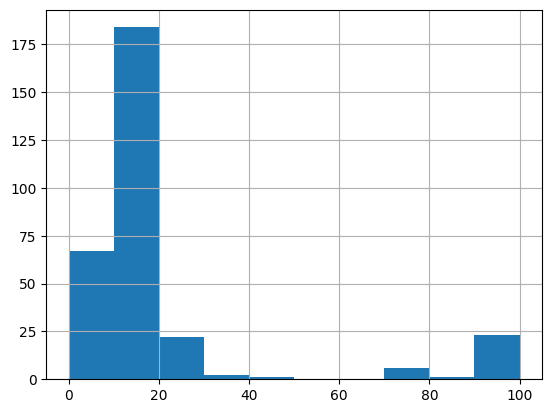

In [11]:
nan_value_X_data_player_away=calculate_nan_percentage(X_data_player_away)
nan_value_X_data_player_away.hist()

### Plus de 40% je drop la colonne 
### En dessous je drop la ligne, surement le joueur n'est pas relevant

In [12]:
columns_to_drop_X_data_player_away=list(nan_value_X_data_player_away[nan_value_X_data_player_away>40].index)+['POSITION']
                                                                                                              

In [13]:
X_data_player_away_nonancol=X_data_player_away.drop(columns=columns_to_drop_X_data_player_away+['LEAGUE','TEAM_NAME','PLAYER_NAME'],axis=1)
X_data_player_away_preproc=X_data_player_away_nonancol.fillna(0).groupby('ID').mean()

In [14]:
X_data_player_away_nonancol_test=X_data_player_away_test.drop(columns=columns_to_drop_X_data_player_away,axis=1)
X_data_player_away_preproc_test=X_data_player_away_nonancol_test.fillna(0).groupby('ID').mean()

In [15]:
nan_value_X_data_team_away=calculate_nan_percentage(X_data_team_away)
nan_value_X_data_team_away

TEAM_INJURIES_5_last_match_std                26.928391
TEAM_INJURIES_5_last_match_sum                23.839714
TEAM_INJURIES_5_last_match_average            23.831586
TEAM_INJURIES_season_std                      23.782817
TEAM_INJURIES_season_sum                      15.939202
                                                ...    
TEAM_ATTACKS_5_last_match_sum                  0.000000
TEAM_ATTACKS_5_last_match_average              0.000000
TEAM_DANGEROUS_ATTACKS_5_last_match_sum        0.000000
TEAM_SHOTS_OFF_TARGET_5_last_match_average     0.000000
LEAGUE                                         0.000000
Length: 142, dtype: float64

### Je vais fill avec des 0, mais c'est très discutable

In [16]:
X_data_team_away_filled=X_data_team_away.fillna(0)

In [17]:
X_data_team_away_filled_test=X_data_team_away_test.fillna(0)

In [18]:
X_data_away_prepoc=pd.merge(X_data_team_away_filled, X_data_player_away_preproc, left_index=True, right_index=True).drop(columns=['LEAGUE','TEAM_NAME'],axis=1)  


In [19]:
X_data_away_prepoc_test=pd.merge(X_data_team_away_filled_test, X_data_player_away_preproc_test, left_index=True, right_index=True).drop(columns=['LEAGUE','TEAM_NAME'],axis=1,errors='ignore')  


In [20]:
sum_columns=[col for col in X_data_away_prepoc.columns if 'sum' in col]
# std_columns=[col for col in X_data_away_prepoc.columns if 'std' in col]
avg_columns=[col for col in X_data_away_prepoc.columns if 'average' in col]

In [21]:
# for col in sum_columns: # J'ai check si tous les radicaux, radicaux_sum sont dans radicaux_avg
#     if col not in avg_columns:
#         print(col)

In [22]:
X_data_away_prepoc_nosum=X_data_away_prepoc.drop(columns=sum_columns,axis=1)

In [23]:
X_data_away_prepoc_test_nosum=X_data_away_prepoc_test.drop(columns=sum_columns,axis=1)

In [24]:
corr_matrix = X_data_away_prepoc_nosum.corr()

# plt.figure(figsize=(30, 15))
# # sns.heatmap(corr_matrix, annot=True, cmap='viridis', linewidths=.01)

# plt.title('Correlation Matrix')
# plt.xticks(rotation=90)
# plt.yticks(rotation=0)

In [25]:
corr_matrix.style.background_gradient(cmap='coolwarm')

In [26]:
columns=list(corr_matrix.columns)
corr_col=set()
visited=set()
for col1 in columns:
    if col1 not in visited:
        for col2 in columns:
            if col2 not in visited:
                if col1!=col2:
                    value=abs(np.round(corr_matrix.loc[col1,col2],2))
                    if value>=0.9:
                        print(f"{col1} with std {np.round(np.std(X_data_away_prepoc_test[col1]),2)} is highly correlated with {col2} with std {np.round(np.std(X_data_away_prepoc_test[col2]),2)} and correlation {value}\n")
                        if 'SUCCESSFUL' not in col1 or 'std' in col1:
                            corr_col.add(col1)
                        else:
                            corr_col.add(col2)
                        visited.add(col2)
    visited.add(col1)

TEAM_PASSES_season_average with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_season_average with std 2.87 and correlation 0.97

TEAM_PASSES_season_average with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average with std 2.93 and correlation 0.9

TEAM_PASSES_season_std with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_season_std with std 2.87 and correlation 0.94

TEAM_PASSES_5_last_match_average with std 2.9 is highly correlated with TEAM_SUCCESSFUL_PASSES_5_last_match_average with std 2.9 and correlation 0.98

TEAM_REDCARDS_5_last_match_average with std 3.53 is highly correlated with TEAM_REDCARDS_5_last_match_std with std 3.85 and correlation 0.93

TEAM_PASSES_5_last_match_std with std 2.9 is highly correlated with TEAM_SUCCESSFUL_PASSES_5_last_match_std with std 2.9 and correlation 0.94

PLAYER_ACCURATE_CROSSES_season_average with std 3.28 is highly correlated with PLAYER_TOTAL_CROSSES_season_average with std 3.61 and correl

In [27]:
len(corr_col)

54

In [28]:
X_data_away_prepoc_nosum_nocorr=X_data_away_prepoc_nosum.drop(columns=list(corr_col),axis=1)

In [29]:
X_data_away_prepoc_test_nosum_nocorr=X_data_away_prepoc_test_nosum.drop(columns=list(corr_col),axis=1)

In [30]:
corr_matrix2 = X_data_away_prepoc_nosum_nocorr.corr()
corr_matrix2.style.background_gradient(cmap='coolwarm')

In [31]:
X_data_away_prepoc_nosum_nocorr

,TEAM_SHOTS_TOTAL_season_average,TEAM_SHOTS_INSIDEBOX_season_average,TEAM_SHOTS_OFF_TARGET_season_average,TEAM_SHOTS_ON_TARGET_season_average,TEAM_SHOTS_OUTSIDEBOX_season_average,TEAM_SUCCESSFUL_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,TEAM_SAVES_season_average,TEAM_CORNERS_season_average,TEAM_BALL_POSSESSION_season_average,TEAM_FOULS_season_average,TEAM_YELLOWCARDS_season_average,TEAM_REDCARDS_season_average,TEAM_OFFSIDES_season_average,TEAM_ATTACKS_season_average,TEAM_PENALTIES_season_average,TEAM_SUBSTITUTIONS_season_average,TEAM_BALL_SAFE_season_average,TEAM_DANGEROUS_ATTACKS_season_average,TEAM_INJURIES_season_average,TEAM_GOALS_season_average,TEAM_GAME_WON_season_average,TEAM_GAME_DRAW_season_average,TEAM_GAME_LOST_season_average,TEAM_SHOTS_TOTAL_season_std,TEAM_SHOTS_INSIDEBOX_season_std,TEAM_SHOTS_OFF_TARGET_season_std,TEAM_SHOTS_ON_TARGET_season_std,TEAM_SHOTS_OUTSIDEBOX_season_std,TEAM_SUCCESSFUL_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_std,TEAM_SAVES_season_std,TEAM_CORNERS_season_std,TEAM_BALL_POSSESSION_season_std,TEAM_FOULS_season_std,TEAM_YELLOWCARDS_season_std,TEAM_REDCARDS_season_std,TEAM_OFFSIDES_season_std,TEAM_ATTACKS_season_std,TEAM_PENALTIES_season_std,TEAM_SUBSTITUTIONS_season_std,TEAM_BALL_SAFE_season_std,TEAM_DANGEROUS_ATTACKS_season_std,TEAM_INJURIES_season_std,TEAM_GOALS_season_std,TEAM_SHOTS_TOTAL_5_last_match_average,TEAM_SHOTS_INSIDEBOX_5_last_match_average,TEAM_SHOTS_OFF_TARGET_5_last_match_average,TEAM_SHOTS_ON_TARGET_5_last_match_average,TEAM_SHOTS_OUTSIDEBOX_5_last_match_average,TEAM_SUCCESSFUL_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,TEAM_SAVES_5_last_match_average,TEAM_CORNERS_5_last_match_average,TEAM_BALL_POSSESSION_5_last_match_average,TEAM_FOULS_5_last_match_average,TEAM_YELLOWCARDS_5_last_match_average,TEAM_OFFSIDES_5_last_match_average,TEAM_ATTACKS_5_last_match_average,TEAM_PENALTIES_5_last_match_average,TEAM_SUBSTITUTIONS_5_last_match_average,TEAM_BALL_SAFE_5_last_match_average,TEAM_DANGEROUS_ATTACKS_5_last_match_average,TEAM_INJURIES_5_last_match_average,TEAM_GOALS_5_last_match_average,TEAM_GAME_WON_5_last_match_average,TEAM_GAME_DRAW_5_last_match_average,TEAM_GAME_LOST_5_last_match_average,TEAM_SHOTS_TOTAL_5_last_match_std,TEAM_SHOTS_INSIDEBOX_5_last_match_std,TEAM_SHOTS_OFF_TARGET_5_last_match_std,TEAM_SHOTS_ON_TARGET_5_last_match_std,TEAM_SHOTS_OUTSIDEBOX_5_last_match_std,TEAM_SUCCESSFUL_PASSES_5_last_match_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_std,TEAM_SAVES_5_last_match_std,TEAM_CORNERS_5_last_match_std,TEAM_BALL_POSSESSION_5_last_match_std,TEAM_FOULS_5_last_match_std,TEAM_YELLOWCARDS_5_last_match_std,TEAM_REDCARDS_5_last_match_std,TEAM_OFFSIDES_5_last_match_std,TEAM_ATTACKS_5_last_match_std,TEAM_PENALTIES_5_last_match_std,TEAM_SUBSTITUTIONS_5_last_match_std,TEAM_BALL_SAFE_5_last_match_std,TEAM_DANGEROUS_ATTACKS_5_last_match_std,TEAM_INJURIES_5_last_match_std,TEAM_GOALS_5_last_match_std,PLAYER_ASSISTS_season_average,PLAYER_BIG_CHANCES_CREATED_season_average,PLAYER_BIG_CHANCES_MISSED_season_average,PLAYER_BLOCKED_SHOTS_season_average,PLAYER_CLEARANCES_season_average,PLAYER_GOALKEEPER_GOALS_CONCEDED_season_average,PLAYER_GOALS_season_average,PLAYER_GOALS_CONCEDED_season_average,PLAYER_HIT_WOODWORK_season_average,PLAYER_INTERCEPTIONS_season_average,PLAYER_OFFSIDES_season_average,PLAYER_PASSES_season_average,PLAYER_SAVES_INSIDE_BOX_season_average,PLAYER_SHOTS_BLOCKED_season_average,PLAYER_SHOTS_TOTAL_season_average,PLAYER_STARTING_LINEUP_season_average,PLAYER_SUCCESSFUL_DRIBBLES_season_average,PLAYER_TOTAL_CROSSES_season_average,PLAYER_TOTAL_DUELS_season_average,PLAYER_YELLOWCARDS_season_average,PLAYER_ACCURATE_CROSSES_season_std,PLAYER_ACCURATE_PASSES_PERCENTAGE_season_std,PLAYER_AERIALS_WON_season_std,PLAYER_ASSISTS_season_std,PLAYER_BIG_CHANCES_CREATED_season_std,PLAYER_BIG_CHANCES_MISSED_season_std,PLAYER_BLOCKED_SHOTS_season_std,PLAYER_CLEARANCES_season_std,PLAYER_CLEARANCE_OF

### Il faudra surement standardiser les colonnes vu les grosses valeurs. Apres pour ce type de features qui ressemblent a des features categoriques je sais pas

In [32]:
Y_train=Y_data_train['HOME_WINS']-Y_data_train['AWAY_WINS']
Y_train=pd.DataFrame(Y_train,columns=['TARGET'])
Y_train

,TARGET
ID,
0,-1
1,0
2,-1
3,1
4,0
...,...
12298,-1
12299,-1
12300,-1


array([[<Axes: title={'center': 'TARGET'}>]], dtype=object)

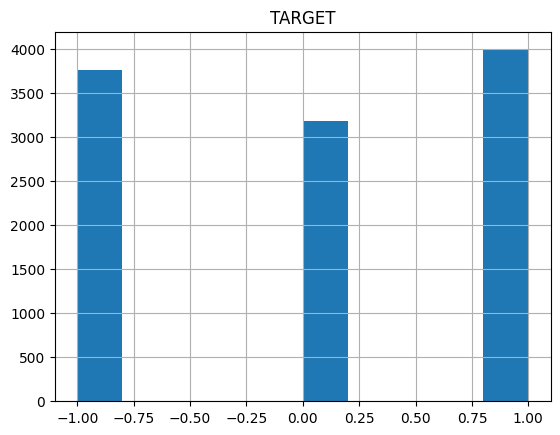

In [36]:
idx_home=np.where(Y_train['TARGET'] == 1)[0]
idx_away=np.where(Y_train['TARGET'] ==-1)[0]
idx_draw=np.where(Y_train['TARGET'] == 0)[0]
idx_home_choice=np.random.choice(idx_home,4000)
idx_balance=list(idx_home_choice)+list(idx_away)+list(idx_draw)
Y_train.iloc[idx_balance].hist()

## Je suppose que :

HOME WINS= on a gagne 1
DRAW= on a fait nul 0 
AWAY WINS= on a perdu -1
Probleme de classification avec 3 classes
Mon idee ce serait de faire un LGBM1 avec le dataset away, un autre LGBM2 avec le dataset home recuperer les probabilites de chaque classe ou et faire le classement nous meme en fonction des probabilites.

Ma question c'est plus au sujet du dataset de train, il faut faire un dataset sur les equipes ou un dataset sur les joueurs en essayant de ressortir des caracteristiques globales des joueurs de l'équipe. 

In [37]:
y_map={'0_1':'HOME_WINS','0_0':'DRAW','0_-1':'AWAY_WINS'}

In [164]:
X_train_f, X_val, Y_train_f, Y_val = train_test_split(
     X_data_away_prepoc_nosum_nocorr, Y_train, test_size=0.2, random_state=4)

In [39]:
# clf = lgb.LGBMClassifier()
# clf.fit(X_train_f, Y_train_f)

In [184]:
clf,study=run_study(X_train_f,Y_train_f['TARGET'].values,n_trials=500, n_jobs=2)


[I 2024-03-01 22:20:11,044] A new study created in memory with name: no-name-2f14067e-fac0-4558-8e46-4f1443ec6aed
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 1000] and step=10, but the range is not divisible by `step`. It will be replaced by [1, 991].

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The 

[I 2024-03-01 22:24:03,922] Trial 3 finished with value: 0.46413320152096277 and parameters: {'min_data_in_leaf': 351, 'min_gain_to_split': 25.40418293330054, 'num_leaves': 577, 'learning_rate': 0.0034081352309317772, 'max_depth': 8, 'min_child_samples': 45, 'n_estimators': 741}. Best is trial 4 with value: 0.4690100527579839.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1

[I 2024-03-01 22:33:35,255] Trial 15 finished with value: 0.46870517470920336 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 10.195574392560843, 'num_leaves': 793, 'learning_rate': 0.09971010027306527, 'max_depth': 10, 'min_child_samples': 164, 'n_estimators': 411}. Best is trial 4 with value: 0.4690100527579839.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-01 22:37:13,936] Trial 22 finished with value: 0.46850237691730834 and parameters: {'min_data_in_leaf': 1051, 'min_gain_to_split': 13.276504592063748, 'num_leaves': 707, 'learning_rate': 0.07021286583652066, 'max_depth': 10, 'min_child_samples': 106, 'n_estimators': 431}. Best is trial 21 with value: 0.46901030052559767.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-01 22:40:14,779] Trial 30 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 10.48355741514606, 'num_leaves': 874, 'learning_rate': 0.00012873941104828024, 'max_depth': 9, 'min_child_samples': 120, 'n_estimators': 141}. Best is trial 21 with value: 0.46901030052559767.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-01 22:44:07,424] Trial 39 finished with value: 0.46982301959346295 and parameters: {'min_data_in_leaf': 1501, 'min_gain_to_split': 7.712971373995937, 'num_leaves': 607, 'learning_rate': 0.016955553547984, 'max_depth': 14, 'min_child_samples': 132, 'n_estimators': 681}. Best is trial 39 with value: 0.46982301959346295.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-01 22:51:12,100] Trial 47 finished with value: 0.4698232673610767 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 7.532096611852369, 'num_leaves': 571, 'learning_rate': 0.009740092557224592, 'max_depth': 13, 'min_child_samples': 191, 'n_estimators': 911}. Best is trial 44 with value: 0.47053431911807947.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-01 22:55:12,290] Trial 54 finished with value: 0.4695185544907054 and parameters: {'min_data_in_leaf': 1851, 'min_gain_to_split': 7.3852400625503885, 'num_leaves': 578, 'learning_rate': 0.0026664060872417785, 'max_depth': 12, 'min_child_samples': 200, 'n_estimators': 801}. Best is trial 49 with value: 0.4705345668856933.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-01 23:24:59,410] Trial 62 finished with value: 0.46860375516595476 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 11.751418050865896, 'num_leaves': 580, 'learning_rate': 0.0021424676917179528, 'max_depth': 11, 'min_child_samples': 173, 'n_estimators': 981}. Best is trial 49 with value: 0.4705345668856933.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-01 23:40:41,917] Trial 70 finished with value: 0.46799387518458685 and parameters: {'min_data_in_leaf': 1451, 'min_gain_to_split': 14.231939202696758, 'num_leaves': 395, 'learning_rate': 0.006703515476394541, 'max_depth': 14, 'min_child_samples': 167, 'n_estimators': 891}. Best is trial 67 with value: 0.4710426969669941.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 06:26:39,773] Trial 78 finished with value: 0.4665718129651837 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 26.145281564962396, 'num_leaves': 535, 'learning_rate': 0.0036555330784350643, 'max_depth': 13, 'min_child_samples': 161, 'n_estimators': 841}. Best is trial 67 with value: 0.4710426969669941.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 06:33:19,875] Trial 86 finished with value: 0.46890830285791685 and parameters: {'min_data_in_leaf': 1551, 'min_gain_to_split': 11.23929581172622, 'num_leaves': 416, 'learning_rate': 0.003280420071433532, 'max_depth': 14, 'min_child_samples': 43, 'n_estimators': 631}. Best is trial 67 with value: 0.4710426969669941.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 06:39:29,187] Trial 94 finished with value: 0.4684000075982068 and parameters: {'min_data_in_leaf': 1551, 'min_gain_to_split': 15.454880851373185, 'num_leaves': 508, 'learning_rate': 0.007196805525287583, 'max_depth': 14, 'min_child_samples': 51, 'n_estimators': 891}. Best is trial 67 with value: 0.4710426969669941.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 06:45:42,348] Trial 102 finished with value: 0.47083923846146225 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 11.052137378310476, 'num_leaves': 511, 'learning_rate': 0.006037851300882216, 'max_depth': 14, 'min_child_samples': 57, 'n_estimators': 851}. Best is trial 67 with value: 0.4710426969669941.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 06:51:52,131] Trial 109 finished with value: 0.4682990422955835 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 11.977389944089019, 'num_leaves': 137, 'learning_rate': 0.002562623670695661, 'max_depth': 14, 'min_child_samples': 54, 'n_estimators': 911}. Best is trial 105 with value: 0.47165175105631596.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 06:58:00,698] Trial 118 finished with value: 0.47165183364552055 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 13.299142142729117, 'num_leaves': 840, 'learning_rate': 0.004755250147453501, 'max_depth': 15, 'min_child_samples': 85, 'n_estimators': 901}. Best is trial 112 with value: 0.47165187494012284.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:03:28,594] Trial 126 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 15.003381833497764, 'num_leaves': 807, 'learning_rate': 0.0002790944958740063, 'max_depth': 15, 'min_child_samples': 110, 'n_estimators': 871}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specif

[I 2024-03-02 07:08:40,246] Trial 134 finished with value: 0.4717533770725761 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 13.766000846376173, 'num_leaves': 845, 'learning_rate': 0.004830241763984714, 'max_depth': 15, 'min_child_samples': 70, 'n_estimators': 851}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 07:14:08,502] Trial 142 finished with value: 0.46992406748529086 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 15.636540546146707, 'num_leaves': 866, 'learning_rate': 0.006749348147454905, 'max_depth': 15, 'min_child_samples': 69, 'n_estimators': 851}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:18:50,699] Trial 150 finished with value: 0.46901017664179084 and parameters: {'min_data_in_leaf': 1751, 'min_gain_to_split': 14.027172433333243, 'num_leaves': 773, 'learning_rate': 0.005795995334633094, 'max_depth': 14, 'min_child_samples': 91, 'n_estimators': 811}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:23:49,430] Trial 157 finished with value: 0.4667745694624764 and parameters: {'min_data_in_leaf': 251, 'min_gain_to_split': 15.77002414488666, 'num_leaves': 787, 'learning_rate': 0.004061688388262129, 'max_depth': 14, 'min_child_samples': 73, 'n_estimators': 951}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:29:16,479] Trial 166 finished with value: 0.46972155875561195 and parameters: {'min_data_in_leaf': 1601, 'min_gain_to_split': 12.650600269314058, 'num_leaves': 919, 'learning_rate': 0.00331541511479768, 'max_depth': 15, 'min_child_samples': 100, 'n_estimators': 891}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:33:34,583] Trial 174 finished with value: 0.46921334608510656 and parameters: {'min_data_in_leaf': 1751, 'min_gain_to_split': 14.213976660155298, 'num_leaves': 863, 'learning_rate': 0.006468505390568968, 'max_depth': 14, 'min_child_samples': 66, 'n_estimators': 871}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:39:14,944] Trial 182 finished with value: 0.4701277324638342 and parameters: {'min_data_in_leaf': 1601, 'min_gain_to_split': 13.635655433151598, 'num_leaves': 973, 'learning_rate': 0.0024862451813803784, 'max_depth': 15, 'min_child_samples': 75, 'n_estimators': 971}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:45:05,962] Trial 190 finished with value: 0.4689085919201329 and parameters: {'min_data_in_leaf': 1751, 'min_gain_to_split': 14.592549403724362, 'num_leaves': 935, 'learning_rate': 0.003694430059907182, 'max_depth': 15, 'min_child_samples': 71, 'n_estimators': 971}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 07:50:01,904] Trial 198 finished with value: 0.46819712721710716 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 15.645376868958968, 'num_leaves': 997, 'learning_rate': 0.004268581959567367, 'max_depth': 15, 'min_child_samples': 91, 'n_estimators': 941}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 07:54:51,741] Trial 206 finished with value: 0.47175308801036 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 15.018293942886146, 'num_leaves': 932, 'learning_rate': 0.0035910349050033473, 'max_depth': 15, 'min_child_samples': 84, 'n_estimators': 901}. Best is trial 122 with value: 0.47215955078079835.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 07:59:54,981] Trial 214 finished with value: 0.47165179235091825 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 13.492730888294293, 'num_leaves': 913, 'learning_rate': 0.003214559779393546, 'max_depth': 15, 'min_child_samples': 78, 'n_estimators': 891}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 08:05:04,612] Trial 222 finished with value: 0.4692130157282881 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 14.060080252568982, 'num_leaves': 966, 'learning_rate': 0.003868681475772639, 'max_depth': 15, 'min_child_samples': 74, 'n_estimators': 931}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:09:54,097] Trial 230 finished with value: 0.4704323214503986 and parameters: {'min_data_in_leaf': 1601, 'min_gain_to_split': 14.79276086747764, 'num_leaves': 931, 'learning_rate': 0.00528238540470241, 'max_depth': 15, 'min_child_samples': 73, 'n_estimators': 881}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 08:14:22,045] Trial 238 finished with value: 0.4690101766417908 and parameters: {'min_data_in_leaf': 1751, 'min_gain_to_split': 14.097822648391261, 'num_leaves': 916, 'learning_rate': 0.004879541489417274, 'max_depth': 15, 'min_child_samples': 63, 'n_estimators': 911}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:19:27,945] Trial 246 finished with value: 0.47002577609075563 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 14.831766415643816, 'num_leaves': 893, 'learning_rate': 0.0033475047189575973, 'max_depth': 15, 'min_child_samples': 76, 'n_estimators': 901}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 08:24:28,405] Trial 254 finished with value: 0.4684004618388321 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 13.37737182132251, 'num_leaves': 927, 'learning_rate': 0.0036139553936111223, 'max_depth': 15, 'min_child_samples': 84, 'n_estimators': 871}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:28:47,286] Trial 262 finished with value: 0.4687052160038057 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 12.549286395128041, 'num_leaves': 852, 'learning_rate': 0.0029614051039989907, 'max_depth': 15, 'min_child_samples': 79, 'n_estimators': 481}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 08:33:22,491] Trial 270 finished with value: 0.4695182654284893 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 12.768561751522848, 'num_leaves': 924, 'learning_rate': 0.005853495023007098, 'max_depth': 15, 'min_child_samples': 62, 'n_estimators': 911}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:37:44,093] Trial 279 finished with value: 0.469924645609723 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 12.137598709498308, 'num_leaves': 907, 'learning_rate': 0.004563449297689686, 'max_depth': 15, 'min_child_samples': 101, 'n_estimators': 531}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:42:49,572] Trial 286 finished with value: 0.4695182654284893 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 13.084294533459973, 'num_leaves': 950, 'learning_rate': 0.004128321092300182, 'max_depth': 15, 'min_child_samples': 80, 'n_estimators': 951}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:48:01,331] Trial 294 finished with value: 0.46972093933657744 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 15.16700368325898, 'num_leaves': 710, 'learning_rate': 0.002298836146945186, 'max_depth': 15, 'min_child_samples': 71, 'n_estimators': 881}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:52:24,216] Trial 302 finished with value: 0.4717533770725761 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 13.437171171984307, 'num_leaves': 819, 'learning_rate': 0.00599239277055986, 'max_depth': 15, 'min_child_samples': 100, 'n_estimators': 871}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:56:39,504] Trial 310 finished with value: 0.46961927202571496 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 15.79031353943593, 'num_leaves': 883, 'learning_rate': 0.005937332188883357, 'max_depth': 14, 'min_child_samples': 108, 'n_estimators': 881}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 09:01:08,219] Trial 318 finished with value: 0.4722611355024562 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 14.68193958629092, 'num_leaves': 843, 'learning_rate': 0.00524925969108609, 'max_depth': 15, 'min_child_samples': 108, 'n_estimators': 821}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 09:05:15,604] Trial 326 finished with value: 0.4528570496493262 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 36.708815857564176, 'num_leaves': 874, 'learning_rate': 0.004464183154897349, 'max_depth': 15, 'min_child_samples': 109, 'n_estimators': 841}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 09:08:52,657] Trial 334 finished with value: 0.46961923073111267 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 16.855645404979292, 'num_leaves': 856, 'learning_rate': 0.0054962647888278215, 'max_depth': 15, 'min_child_samples': 101, 'n_estimators': 861}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifi

[I 2024-03-02 09:11:00,260] Trial 342 finished with value: 0.46921280925527664 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 16.00116484816038, 'num_leaves': 817, 'learning_rate': 0.002445147381047366, 'max_depth': 15, 'min_child_samples': 94, 'n_estimators': 891}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 09:12:55,788] Trial 350 finished with value: 0.46779049926825966 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 19.388676651280548, 'num_leaves': 842, 'learning_rate': 0.0038650918460792507, 'max_depth': 15, 'min_child_samples': 86, 'n_estimators': 841}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 09:15:12,125] Trial 358 finished with value: 0.4705339061720565 and parameters: {'min_data_in_leaf': 1601, 'min_gain_to_split': 14.79689448138449, 'num_leaves': 959, 'learning_rate': 0.005342430731422474, 'max_depth': 15, 'min_child_samples': 127, 'n_estimators': 821}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 09:17:17,753] Trial 366 finished with value: 0.46779078833047577 and parameters: {'min_data_in_leaf': 601, 'min_gain_to_split': 13.017277273005579, 'num_leaves': 942, 'learning_rate': 0.0030192574213324013, 'max_depth': 15, 'min_child_samples': 74, 'n_estimators': 451}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 09:19:34,191] Trial 374 finished with value: 0.4667745281678741 and parameters: {'min_data_in_leaf': 351, 'min_gain_to_split': 12.681919333616973, 'num_leaves': 887, 'learning_rate': 0.0034656248344093524, 'max_depth': 15, 'min_child_samples': 79, 'n_estimators': 831}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 11:15:46,794] Trial 382 finished with value: 0.4721597572538098 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 13.417739792168916, 'num_leaves': 863, 'learning_rate': 0.0026665914561971264, 'max_depth': 15, 'min_child_samples': 91, 'n_estimators': 871}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:33:05,134] Trial 390 finished with value: 0.4710424491993802 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 12.259100991834158, 'num_leaves': 945, 'learning_rate': 0.002789402270659485, 'max_depth': 15, 'min_child_samples': 103, 'n_estimators': 951}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:35:19,567] Trial 399 finished with value: 0.4667746933462833 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 22.726342467725257, 'num_leaves': 893, 'learning_rate': 0.0051992814863647905, 'max_depth': 15, 'min_child_samples': 119, 'n_estimators': 831}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 12:37:29,867] Trial 406 finished with value: 0.4693145178607414 and parameters: {'min_data_in_leaf': 1551, 'min_gain_to_split': 14.01507560140325, 'num_leaves': 943, 'learning_rate': 0.00354995918873527, 'max_depth': 15, 'min_child_samples': 110, 'n_estimators': 851}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 12:39:49,509] Trial 414 finished with value: 0.46941663941222916 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 12.840483547111864, 'num_leaves': 967, 'learning_rate': 0.004227773940512435, 'max_depth': 10, 'min_child_samples': 82, 'n_estimators': 961}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:41:57,929] Trial 422 finished with value: 0.47215955078079835 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 14.63883699559834, 'num_leaves': 932, 'learning_rate': 0.0037249878311662195, 'max_depth': 15, 'min_child_samples': 95, 'n_estimators': 871}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:44:18,610] Trial 430 finished with value: 0.4587492525676984 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 34.96912269559102, 'num_leaves': 827, 'learning_rate': 0.0045592181379807304, 'max_depth': 15, 'min_child_samples': 105, 'n_estimators': 871}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:46:25,353] Trial 439 finished with value: 0.4613898772063706 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 13.746771368037146, 'num_leaves': 872, 'learning_rate': 0.002162991983054628, 'max_depth': 15, 'min_child_samples': 82, 'n_estimators': 411}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 12:48:35,762] Trial 446 finished with value: 0.47002664327740395 and parameters: {'min_data_in_leaf': 1751, 'min_gain_to_split': 11.325468129066874, 'num_leaves': 973, 'learning_rate': 0.003419287837800742, 'max_depth': 15, 'min_child_samples': 84, 'n_estimators': 951}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:50:41,235] Trial 454 finished with value: 0.469213139612095 and parameters: {'min_data_in_leaf': 1501, 'min_gain_to_split': 13.328262551527935, 'num_leaves': 925, 'learning_rate': 0.005810670674585565, 'max_depth': 11, 'min_child_samples': 94, 'n_estimators': 861}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 12:52:42,581] Trial 462 finished with value: 0.4700258173853579 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 14.468446744499662, 'num_leaves': 951, 'learning_rate': 0.003599547023618445, 'max_depth': 14, 'min_child_samples': 103, 'n_estimators': 971}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 12:54:59,522] Trial 470 finished with value: 0.4700261477421763 and parameters: {'min_data_in_leaf': 1601, 'min_gain_to_split': 13.2671241848861, 'num_leaves': 964, 'learning_rate': 0.005647774717434193, 'max_depth': 15, 'min_child_samples': 110, 'n_estimators': 951}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 12:57:21,025] Trial 478 finished with value: 0.4685020878550923 and parameters: {'min_data_in_leaf': 1801, 'min_gain_to_split': 13.365698675065273, 'num_leaves': 814, 'learning_rate': 0.00612351669915238, 'max_depth': 15, 'min_child_samples': 114, 'n_estimators': 931}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 12:59:38,354] Trial 486 finished with value: 0.47236280281331866 and parameters: {'min_data_in_leaf': 1701, 'min_gain_to_split': 14.477744652956632, 'num_leaves': 785, 'learning_rate': 0.006614876085266941, 'max_depth': 14, 'min_child_samples': 109, 'n_estimators': 811}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 13:01:34,138] Trial 494 finished with value: 0.46890801379570074 and parameters: {'min_data_in_leaf': 1501, 'min_gain_to_split': 14.268065462397164, 'num_leaves': 837, 'learning_rate': 0.003762490887440988, 'max_depth': 14, 'min_child_samples': 115, 'n_estimators': 801}. Best is trial 207 with value: 0.4728707677162103.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

Best params: {'min_data_in_leaf': 1701, 'min_gain_to_split': 14.124697114530019, 'num_leaves': 933, 'learning_rate': 0.0037031717508614025, 'max_depth': 15, 'min_child_samples': 87, 'n_estimators': 891, 'verbosity': -1}
Study statistics: 
  Number of finished trials:  500
Best trial:
  Value:  0.4728707677162103
  Params: 
    min_data_in_leaf: 1701
    min_gain_to_split: 14.124697114530019
    num_leaves: 933
    learning_rate: 0.0037031717508614025
    max_depth: 15
    min_child_samples: 87
    n_estimators: 891


In [169]:
# Get feature importances
feature_importances = clf.feature_importances_

# Create a dictionary of feature names and their importances
feature_importance_dict = dict(zip(X_train_f.columns, feature_importances))

# Sort the dictionary by importance value in descending order
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Get the top n features importances
top_n = 50  # Change this to the number of top features you want
top_n_features_importances = sorted_feature_importance[:top_n]

# Print or use the top n features importances
print("Top {} features importances:".format(top_n))
for feature, importance in top_n_features_importances:
    print("{}: {}".format(feature, importance))


Top 50 features importances:
TEAM_CORNERS_season_average: 5
TEAM_BALL_POSSESSION_season_average: 5
TEAM_GAME_LOST_season_average: 5
TEAM_SAVES_season_average: 3
TEAM_ATTACKS_season_average: 3
TEAM_GAME_WON_season_average: 3
PLAYER_BIG_CHANCES_MISSED_season_average: 3
PLAYER_GOALS_CONCEDED_season_std: 3
PLAYER_STARTING_LINEUP_5_last_match_average: 3
TEAM_SHOTS_TOTAL_5_last_match_average: 2
TEAM_SHOTS_INSIDEBOX_5_last_match_average: 2
PLAYER_PASSES_season_average: 2
PLAYER_ASSISTS_season_std: 2
PLAYER_SAVES_INSIDE_BOX_5_last_match_average: 2
TEAM_SHOTS_TOTAL_season_average: 1
TEAM_SHOTS_ON_TARGET_season_average: 1
TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average: 1
TEAM_DANGEROUS_ATTACKS_season_std: 1
TEAM_CORNERS_5_last_match_average: 1
TEAM_GAME_WON_5_last_match_average: 1
TEAM_INJURIES_5_last_match_std: 1
PLAYER_ASSISTS_season_average: 1
PLAYER_BIG_CHANCES_CREATED_season_average: 1
PLAYER_GOALS_season_average: 1
PLAYER_GOALS_CONCEDED_season_average: 1
PLAYER_ACCURATE_PASSES_PERCENTAGE

In [170]:
clf_50,study_50=run_study(X_train_f[[col[0] for col in top_n_features_importances]],Y_train_f['TARGET'].values,n_trials=50, n_jobs=2)


[I 2024-03-01 21:15:04,503] A new study created in memory with name: no-name-5b9142ce-af82-4684-8c90-04d2f55f085e
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:15:20,737] Trial 0 finished with value: 0.46

[I 2024-03-01 21:17:27,435] Trial 7 finished with value: 0.46707994304648454 and parameters: {'min_data_in_leaf': 800, 'min_gain_to_split': 5.869853774565125, 'num_leaves': 234, 'learning_rate': 0.006752326944326177, 'max_depth': 16, 'min_child_samples': 60, 'reg_alpha': 0.00021417659649627878, 'n_estimators': 740}. Best is trial 8 with value: 0.46728286472218644.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:17:27,775] Trial 9 finished with value: 0.46718161035734695 and pa

[I 2024-03-01 21:19:49,430] Trial 17 finished with value: 0.4660636415892806 and parameters: {'min_data_in_leaf': 350, 'min_gain_to_split': 6.569542395353123, 'num_leaves': 851, 'learning_rate': 0.03305349420272023, 'max_depth': 12, 'min_child_samples': 50, 'reg_alpha': 0.004306947568911156, 'n_estimators': 810}. Best is trial 11 with value: 0.4676895339656363.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:19:56,656] Trial 18 finished with value: 0.4668767736031688 and param

[I 2024-03-01 21:21:21,719] Trial 26 finished with value: 0.46829895970637886 and parameters: {'min_data_in_leaf': 1000, 'min_gain_to_split': 9.943571447288143, 'num_leaves': 137, 'learning_rate': 0.008266024711429927, 'max_depth': 8, 'min_child_samples': 94, 'reg_alpha': 2.2788626318312527e-05, 'n_estimators': 660}. Best is trial 22 with value: 0.4692136764419249.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:23:33,714] Trial 27 finished with value: 0.4676891210196133 and p

[I 2024-03-01 21:24:35,864] Trial 36 finished with value: 0.46840087478485515 and parameters: {'min_data_in_leaf': 800, 'min_gain_to_split': 9.205786400003444, 'num_leaves': 474, 'learning_rate': 0.03901336106055826, 'max_depth': 10, 'min_child_samples': 77, 'reg_alpha': 0.00012564731124129803, 'n_estimators': 140}. Best is trial 22 with value: 0.4692136764419249.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:25:02,661] Trial 35 finished with value: 0.46921355255811803 and p

[I 2024-03-01 21:28:01,171] Trial 44 finished with value: 0.4661651024271315 and parameters: {'min_data_in_leaf': 950, 'min_gain_to_split': 7.13096346827122, 'num_leaves': 214, 'learning_rate': 0.012259167690976971, 'max_depth': 9, 'min_child_samples': 72, 'reg_alpha': 2.9196871773600336e-05, 'n_estimators': 340}. Best is trial 22 with value: 0.4692136764419249.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-03-01 21:28:04,442] Trial 45 finished with value: 0.4685025833903199 and para

Best params: {'min_data_in_leaf': 750, 'min_gain_to_split': 9.963680230815635, 'num_leaves': 284, 'learning_rate': 0.017353325118987833, 'max_depth': 9, 'min_child_samples': 100, 'reg_alpha': 0.00018159557667825333, 'n_estimators': 360, 'verbosity': -1}
Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.4692136764419249
  Params: 
    min_data_in_leaf: 750
    min_gain_to_split: 9.963680230815635
    num_leaves: 284
    learning_rate: 0.017353325118987833
    max_depth: 9
    min_child_samples: 100
    reg_alpha: 0.00018159557667825333
    n_estimators: 360


In [181]:
np.sum(clf_50.predict(X_val)==Y_val['TARGET'])/len(Y_val)

0.4766355140186916

## STUDY PARAMETERS

In [175]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [183]:
optuna.visualization.plot_slice(study)

## SUBMISSION

In [161]:
np.savetxt("away_proba.csv", clf.predict_proba(X_data_away_prepoc_test_nosum_nocorr_scale[top_features]), delimiter=",")


In [143]:
y_submission=pd.get_dummies(pd.DataFrame(y_pred1,index=X_data_away_prepoc_test_nosum_nocorr_scale.index).astype(str),dtype=int).rename(columns=y_map)[['HOME_WINS','DRAW','AWAY_WINS']]


In [144]:
pd.DataFrame(y_pred1,index=X_data_away_prepoc_test_nosum_nocorr_scale.index).head(20)

,0
ID,
12303,1
12304,-1
12305,-1
12306,0
12307,0
12308,0
12309,-1
12310,-1
12311,-1


In [163]:
y_submission

,HOME_WINS,DRAW,AWAY_WINS
ID,,,
12303,1,0,0
12304,0,0,1
12305,0,0,1
12306,0,1,0
12307,0,1,0
...,...,...,...
37666,0,1,0
37667,0,0,1
37668,1,0,0


In [145]:
y_submission.to_csv('Y_test1.csv')

In [ ]:
optuna.visualization.plot_param_importances(study1)

In [ ]:
# X_data_away_prepoc_nocorr.to_csv('X_train_debug.csv')
# Y_train.to_csv('Y_train.csv')

In [ ]:
clf2,study2=run_study(X_data_away_prepoc_nocorr,Y_train['TARGET'],n_trials=100, n_jobs=2)